# Introdução e Preparação

In [209]:
import tensorflow as tf
from d2l import tensorflow as d2l
d2l.use_svg_display()
import pdb
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import numpy as np

In [3]:
class MNIST(d2l.DataModule):
    def __init__(self, batch_size=64):
        super().__init__()
        self.save_hyperparameters()
        self.train, self.val = tf.keras.datasets.mnist.load_data()

In [4]:
data = MNIST()
print(len(data.train[0]), len(data.val[0]))
print(data.train[0].shape)

60000 10000
(60000, 28, 28)


In [5]:
@d2l.add_to_class(MNIST) #@save
def get_dataloader(self, train):
    data = self.train if train else self.val
    process = lambda X, y: (tf.expand_dims(X, axis=3) / 255,
    tf.cast(y, dtype='int32'))
    resize_fn = lambda X, y: (tf.image.resize_with_pad(X, *self.resize), y)
    shuffle_buf = len(data[0]) if train else 1
    return tf.data.Dataset.from_tensor_slices(process(*data)).batch(
    self.batch_size).shuffle(shuffle_buf)


In [6]:
X, y = next(iter(data.train_dataloader()))
print(X.shape, X.dtype, y.shape, y.dtype)

2024-12-01 10:14:19.471404: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:982] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-12-01 10:14:19.473560: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1956] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
2024-12-01 10:14:19.774662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [60000,28,28,1]
	 [[{{node Placeholder/_0}}]]
2024-12-01 10:14

(64, 28, 28, 1) <dtype: 'float32'> (64,) <dtype: 'int32'>


# Implementação MLP

## 2a) Perceptron com uma camada escondida, função de ativação logística, função custo SSE e otimização por descida de gradiente.


In [41]:
class MLP_sigmoid(d2l.Classifier):
    def __init__(self, num_outputs, num_hiddens, lr, loss_fn = tf.keras.losses.MeanSquaredError, optimizer = tf.keras.optimizers.SGD):
        super().__init__()
        self.save_hyperparameters()
        self.net = tf.keras.models.Sequential([
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(num_hiddens, activation='sigmoid'),
            tf.keras.layers.Dense(num_outputs, activation='sigmoid', use_bias=False)])

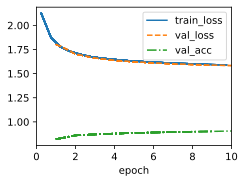

In [42]:
model_2a = MLP_sigmoid(num_outputs=10, num_hiddens=128, lr=0.1)
trainer = d2l.Trainer(max_epochs=10)
trainer.fit(model_2a, data)


In [9]:
test_acc_2a = d2l.evaluate_accuracy(model_2a, data.val_dataloader())
test_acc_2a

2024-12-01 10:17:24.847113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [10000]
	 [[{{node Placeholder/_1}}]]
2024-12-01 10:17:24.847560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [10000]
	 [[{{node Placeholder/_1}}]]


0.9061

## 2b) Saída do tipo softmax, custo "entropia cruzada"

In [10]:
class MLP_softmax(d2l.Classifier):
    def __init__(self, num_outputs, num_hiddens, lr, loss_fn = tf.keras.losses.SparseCategoricalCrossentropy, optimizer = tf.keras.optimizers.SGD):
        super().__init__()
        self.save_hyperparameters()
        self.net = tf.keras.models.Sequential([
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(num_hiddens, activation='sigmoid'),
            tf.keras.layers.Dense(num_outputs, activation='softmax')])

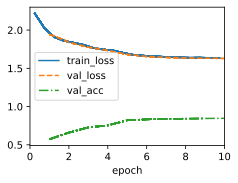

In [11]:
model_2b = MLP_softmax(num_outputs=10, num_hiddens=128, lr=0.1)
trainer = d2l.Trainer(max_epochs=10)
trainer.fit(model_2b, data)


In [12]:
test_acc_2b = d2l.evaluate_accuracy(model_2b, data.val_dataloader())
test_acc_2b

2024-12-01 10:20:45.338810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [10000]
	 [[{{node Placeholder/_1}}]]
2024-12-01 10:20:45.339198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [10000]
	 [[{{node Placeholder/_1}}]]


0.8464

## 2c) Otimizador Adam

In [13]:
class MLP_adam(d2l.Classifier):
    def __init__(self, num_outputs, num_hiddens, lr, loss_fn = tf.keras.losses.SparseCategoricalCrossentropy, optimizer = tf.keras.optimizers.Adam):
        super().__init__()
        self.save_hyperparameters()
        self.net = tf.keras.models.Sequential([
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(num_hiddens, activation='sigmoid'),
            tf.keras.layers.Dense(num_outputs, activation='softmax')])

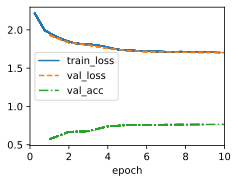

In [14]:
model_2c = MLP_adam(num_outputs=10, num_hiddens=128, lr=0.1)
trainer = d2l.Trainer(max_epochs=10)
trainer.fit(model_2c, data)


In [15]:
test_acc_2c = d2l.evaluate_accuracy(model_2c, data.val_dataloader())
test_acc_2c

2024-12-01 10:24:12.494337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [10000,28,28,1]
	 [[{{node Placeholder/_0}}]]
2024-12-01 10:24:12.494713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [10000]
	 [[{{node Placeholder/_1}}]]


0.7656

## 2d) A função Relu

In [16]:
class MLP_relu(d2l.Classifier):
    def __init__(self, num_outputs, num_hiddens, lr, loss_fn = tf.keras.losses.SparseCategoricalCrossentropy, optimizer = tf.keras.optimizers.Adam):
        super().__init__()
        self.save_hyperparameters()
        self.net = tf.keras.models.Sequential([
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(num_hiddens, activation='relu'),
            tf.keras.layers.Dense(num_outputs, activation='softmax')])

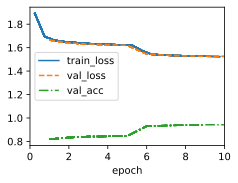

In [17]:
model_2d = MLP_relu(num_outputs=10, num_hiddens=128, lr=0.1)
trainer = d2l.Trainer(max_epochs=10)
trainer.fit(model_2d, data)

In [18]:
test_acc_2d = d2l.evaluate_accuracy(model_2d, data.val_dataloader())
test_acc_2d

2024-12-01 10:28:10.237038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [10000,28,28,1]
	 [[{{node Placeholder/_0}}]]
2024-12-01 10:28:10.237414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [10000]
	 [[{{node Placeholder/_1}}]]


0.9421

## 2e) Redes maiores

In [19]:
class MLP_relu_maior(d2l.Classifier):
    def __init__(self, num_outputs, num_hiddens, lr, loss_fn = tf.keras.losses.SparseCategoricalCrossentropy, optimizer = tf.keras.optimizers.Adam):
        super().__init__()
        self.save_hyperparameters()
        self.net = tf.keras.models.Sequential([
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(num_hiddens, activation='relu'),
            tf.keras.layers.Dense(num_hiddens/2, activation='relu'),
            tf.keras.layers.Dense(num_outputs, activation='softmax')])

### 256 neurônios escondidos

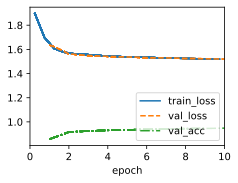

In [20]:
model_2e_1 = MLP_relu(num_outputs=10, num_hiddens=256, lr=0.1)
trainer = d2l.Trainer(max_epochs=10)
trainer.fit(model_2e_1, data)

In [21]:
test_acc_2e_1 = d2l.evaluate_accuracy(model_2e_1, data.val_dataloader())
test_acc_2e_1

2024-12-01 10:31:50.920318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [10000]
	 [[{{node Placeholder/_1}}]]
2024-12-01 10:31:50.920737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [10000]
	 [[{{node Placeholder/_1}}]]


0.9479

### Duas camadas escondidas

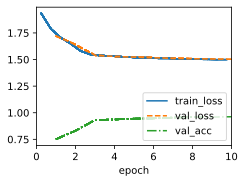

In [81]:
model_2e_2 = MLP_relu_maior(num_outputs=10, num_hiddens=256, lr=0.1)
trainer = d2l.Trainer(max_epochs=10)
trainer.fit(model_2e_2, data)

In [82]:
test_acc_2e_2 = d2l.evaluate_accuracy(model_2e_2, data.val_dataloader())
test_acc_2e_2

2024-12-01 17:23:28.544229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [10000,28,28,1]
	 [[{{node Placeholder/_0}}]]
2024-12-01 17:23:28.545205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [10000]
	 [[{{node Placeholder/_1}}]]


0.9622

# Visualização

In [83]:
@d2l.add_to_class(MNIST) #@save
def text_labels(self, indices):
 """Return text labels."""
 labels = ['0', '1', '2', '3', '4',
 '5', '6', '7', '8', '9']
 return [labels[int(i)] for i in indices]

2024-12-01 23:29:34.243440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [10000,28,28,1]
	 [[{{node Placeholder/_0}}]]
2024-12-01 23:29:34.245173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [10000]
	 [[{{node Placeholder/_1}}]]


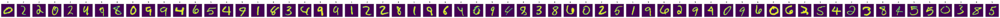

In [197]:
@d2l.add_to_class(MNIST) #@save
def visualize(self, batch, nrows=1, ncols=10, labels=[]):
 X, y = batch
 if not labels:
     labels = self.text_labels(y)
     d2l.show_images(tf.squeeze(X), nrows, y.numpy().size, titles=labels)

i=0
for X, y in data.val_dataloader():
    i+=1
    if i == 23: # Este batch não possui a classe '7'
        data.visualize([X,y]) 

1º minibatch:


2024-12-01 23:42:36.991998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [10000,28,28,1]
	 [[{{node Placeholder/_0}}]]
2024-12-01 23:42:36.993061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [10000]
	 [[{{node Placeholder/_1}}]]


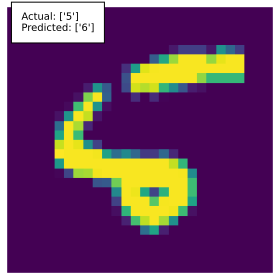

3º minibatch:


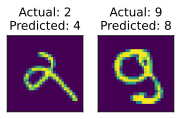

4º minibatch:


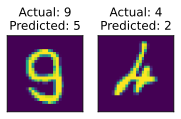

5º minibatch:


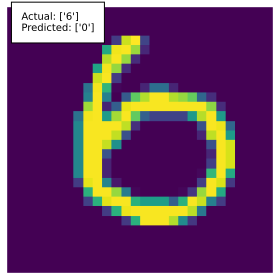

6º minibatch:


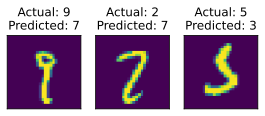

7º minibatch:


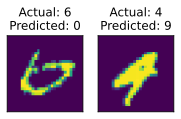

8º minibatch:


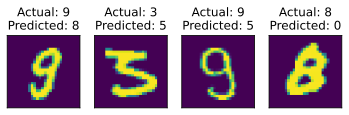

9º minibatch:


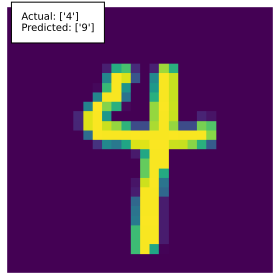

10º minibatch:


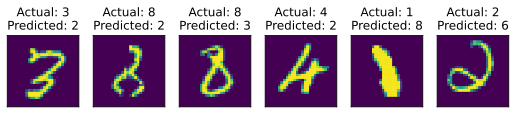

11º minibatch:


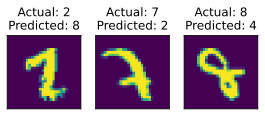

12º minibatch:


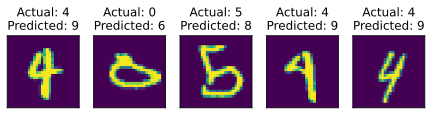

13º minibatch:


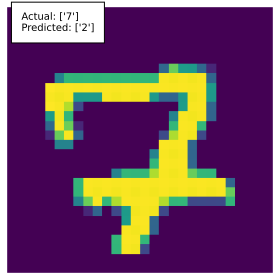

14º minibatch:


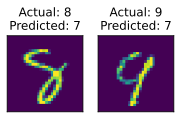

15º minibatch:


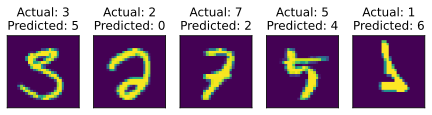

16º minibatch:


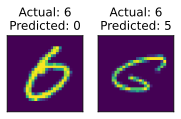

17º minibatch:


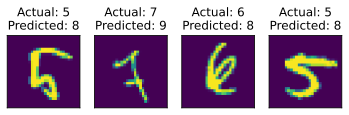

18º minibatch:


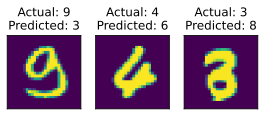

19º minibatch:


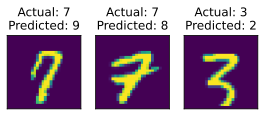

20º minibatch:


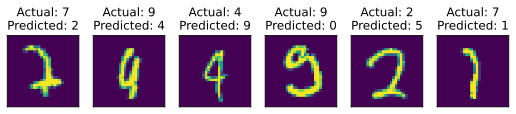

21º minibatch:


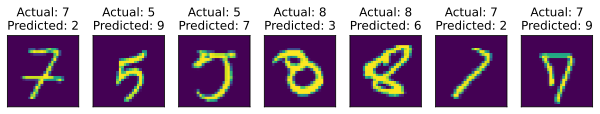

22º minibatch:


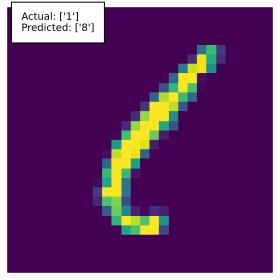

23º minibatch:


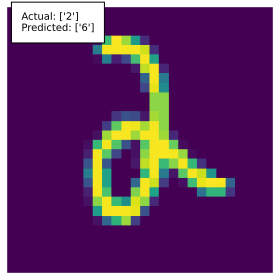

24º minibatch:


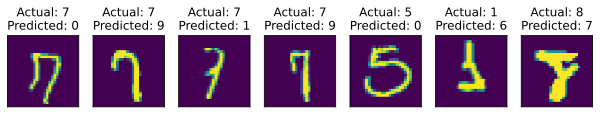

25º minibatch:


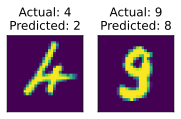

26º minibatch:


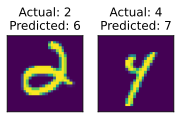

27º minibatch:


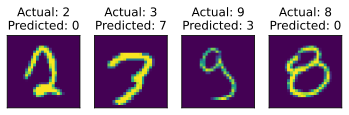

28º minibatch:


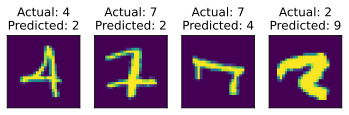

29º minibatch:


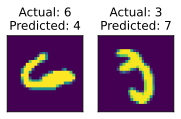

30º minibatch:


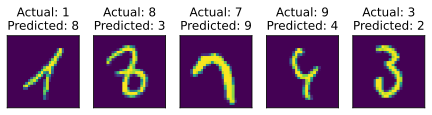

31º minibatch:


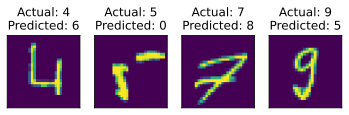

32º minibatch:


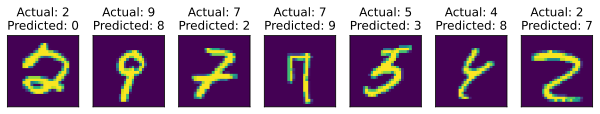

33º minibatch:


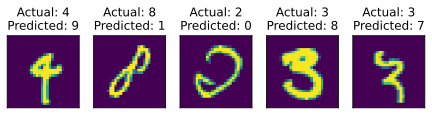

34º minibatch:


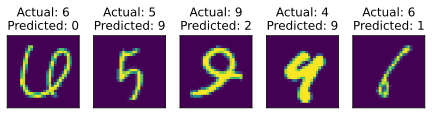

35º minibatch:


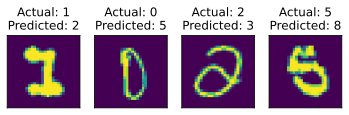

36º minibatch:


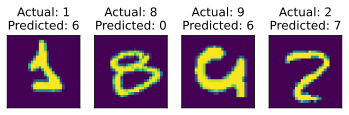

37º minibatch:


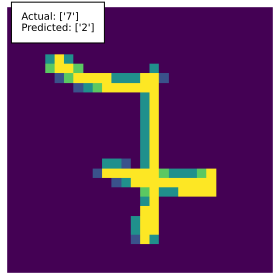

38º minibatch:


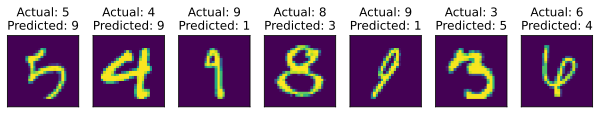

39º minibatch:


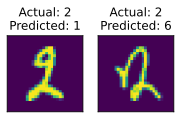

40º minibatch:


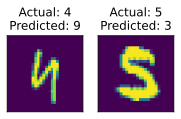

41º minibatch:


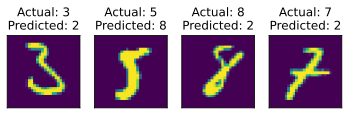

42º minibatch:


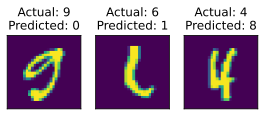

43º minibatch:


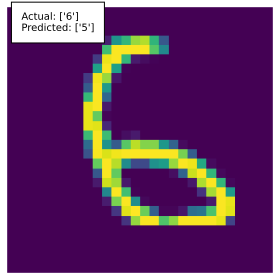

44º minibatch:


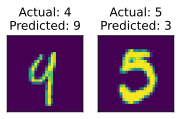

46º minibatch:


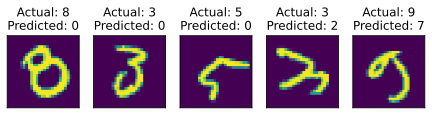

47º minibatch:


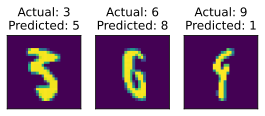

48º minibatch:


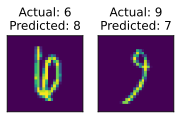

49º minibatch:


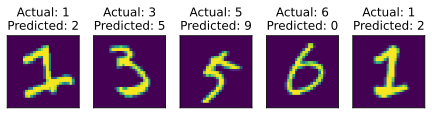

50º minibatch:


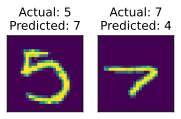

51º minibatch:


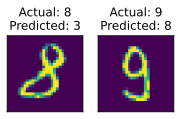

53º minibatch:


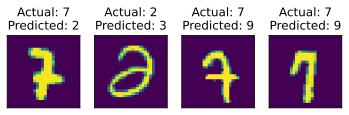

54º minibatch:


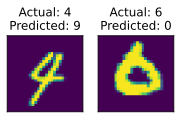

55º minibatch:


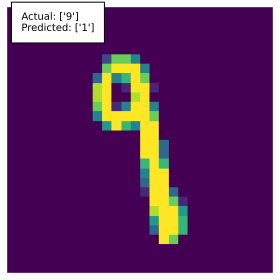

56º minibatch:


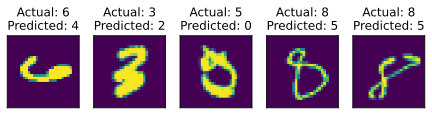

57º minibatch:


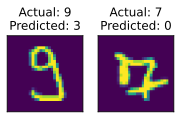

58º minibatch:


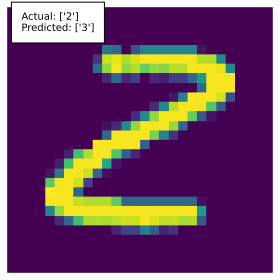

59º minibatch:


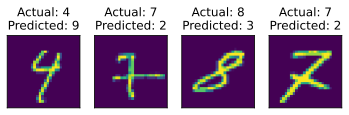

60º minibatch:


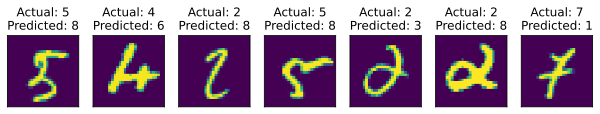

61º minibatch:


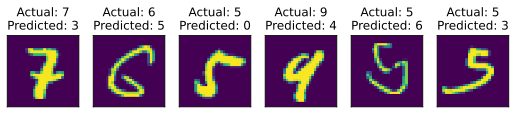

62º minibatch:


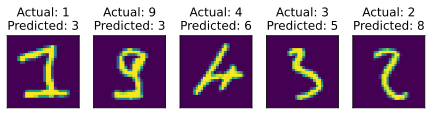

63º minibatch:


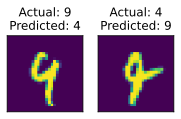

64º minibatch:


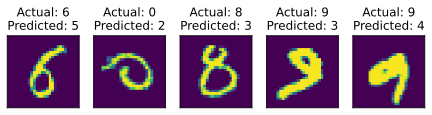

65º minibatch:


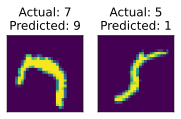

66º minibatch:


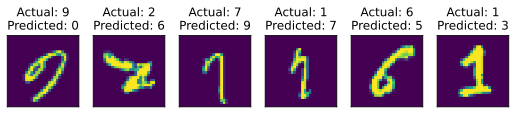

67º minibatch:


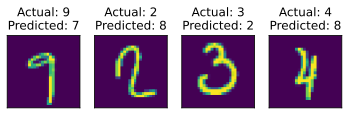

68º minibatch:


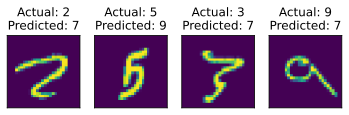

69º minibatch:


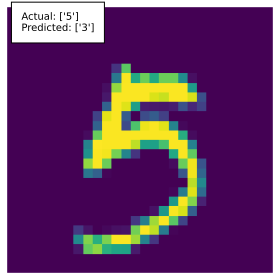

70º minibatch:


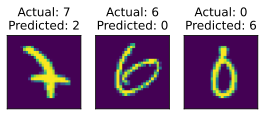

71º minibatch:


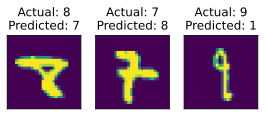

72º minibatch:


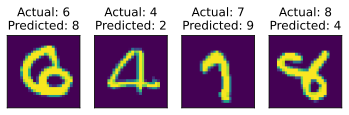

73º minibatch:


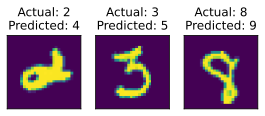

74º minibatch:


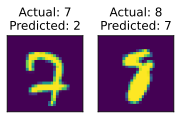

75º minibatch:


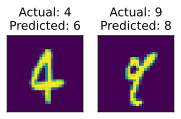

76º minibatch:


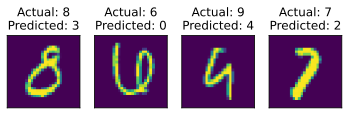

77º minibatch:


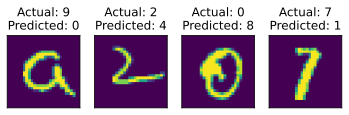

78º minibatch:


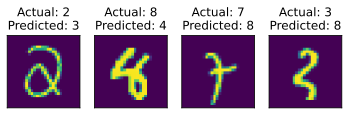

80º minibatch:


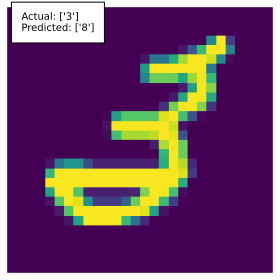

81º minibatch:


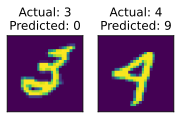

84º minibatch:


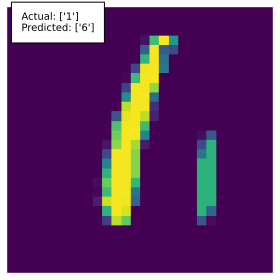

85º minibatch:


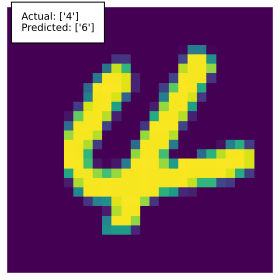

86º minibatch:


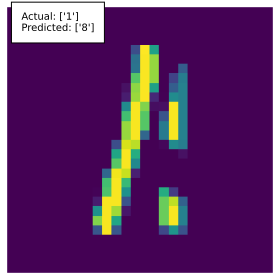

88º minibatch:


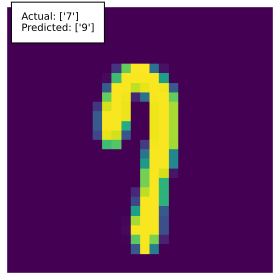

89º minibatch:


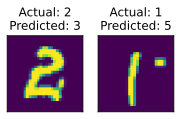

90º minibatch:


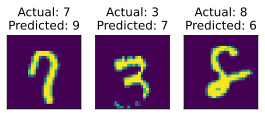

92º minibatch:


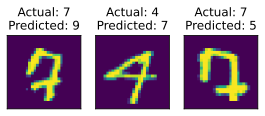

93º minibatch:


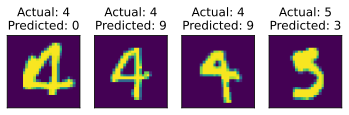

94º minibatch:


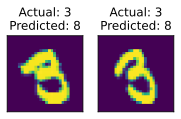

95º minibatch:


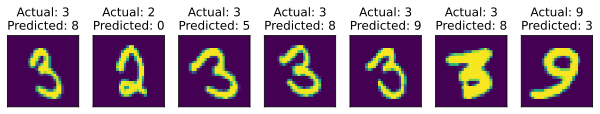

96º minibatch:


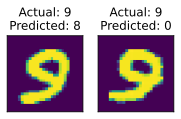

97º minibatch:


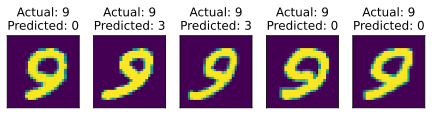

100º minibatch:


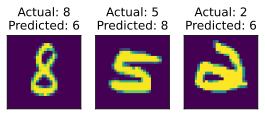

101º minibatch:


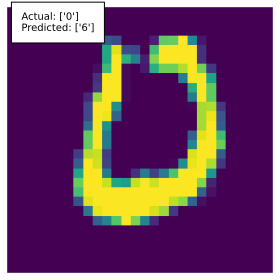

102º minibatch:


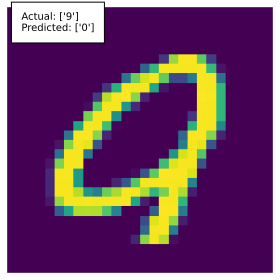

103º minibatch:


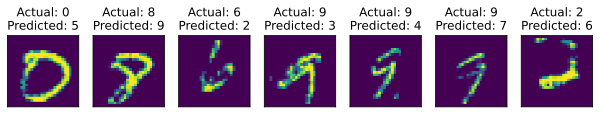

104º minibatch:


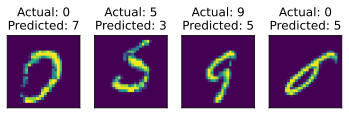

106º minibatch:


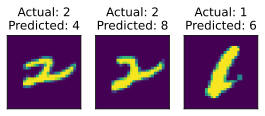

107º minibatch:


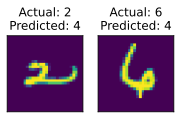

113º minibatch:


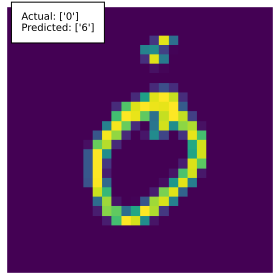

115º minibatch:


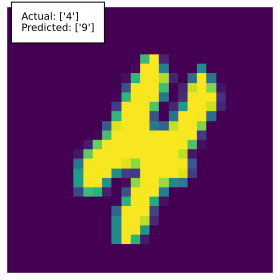

117º minibatch:


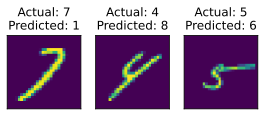

118º minibatch:


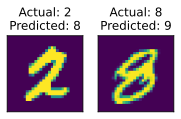

122º minibatch:


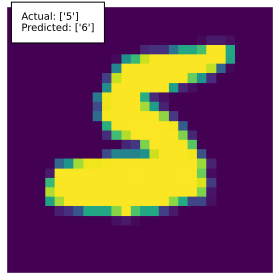

123º minibatch:


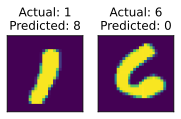

124º minibatch:


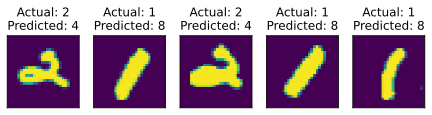

125º minibatch:


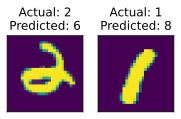

126º minibatch:


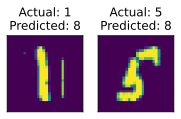

127º minibatch:


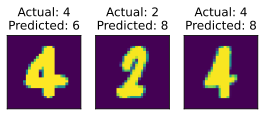

128º minibatch:


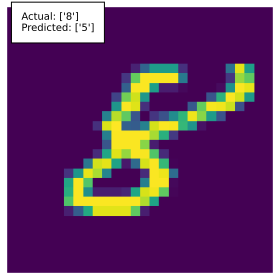

129º minibatch:


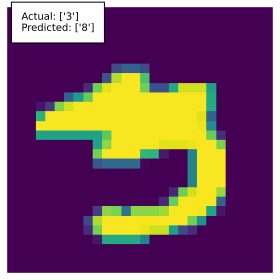

130º minibatch:


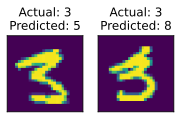

131º minibatch:


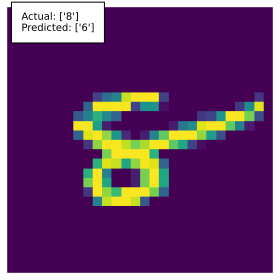

132º minibatch:


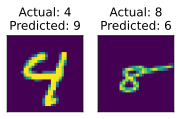

133º minibatch:


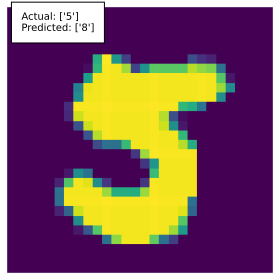

134º minibatch:


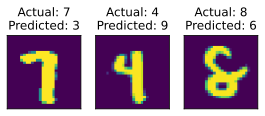

139º minibatch:


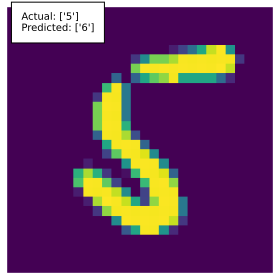

141º minibatch:


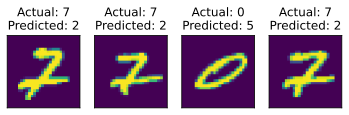

142º minibatch:


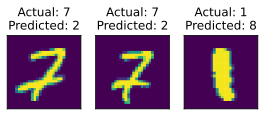

146º minibatch:


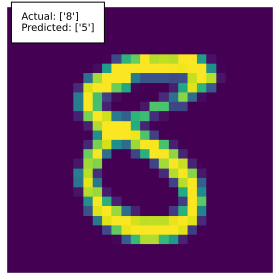

149º minibatch:


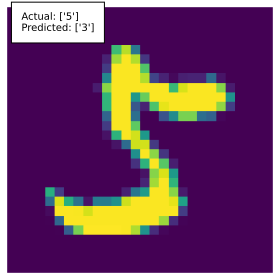

150º minibatch:


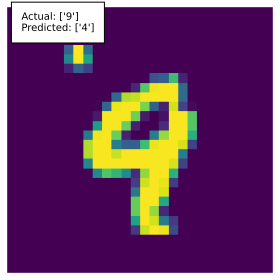

151º minibatch:


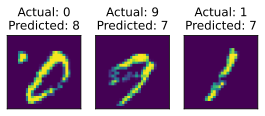

152º minibatch:


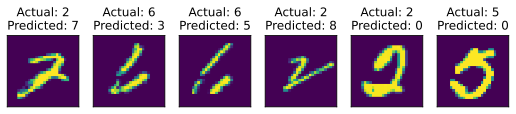

153º minibatch:


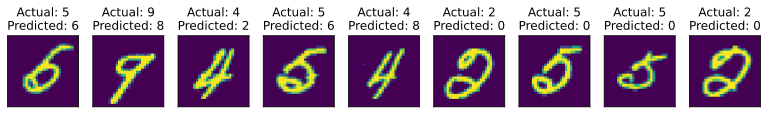

154º minibatch:


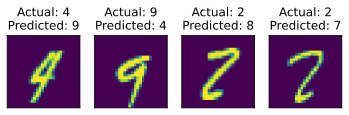

155º minibatch:


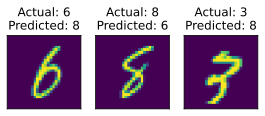

156º minibatch:


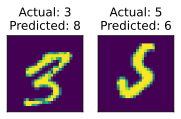

In [218]:
i=0
for X, y in data.val_dataloader():
    i+=1
    preds=tf.argmax(model_2e_2(X),axis=1)
    wrong=tf.cast(preds,y.dtype)!=y
    X, y, preds = X[wrong], y[wrong], preds[wrong]
    if y.numpy().size == 0:
        continue
    
    labels = [ f'Actual: {a[0]}\nPredicted: {b[0]}' for a, b in zip(data.text_labels(y), data.text_labels(preds))]
    if y.numpy().size == 1:
        plt.figure()
        print(f'{i}º minibatch:')
        plt.axis('off')
        plt.text(1, 2, f'Actual: {data.text_labels(y)}\nPredicted: {data.text_labels(preds)}', bbox={'facecolor': 'white', 'pad': 10})
        plt.imshow(tf.squeeze(X))
        plt.show()
    else:
        print(f'{i}º minibatch:')
        d2l.show_images(tf.squeeze(X), 1, y.numpy().size, titles=labels)
        plt.show()
        

# Matriz de confusão

2024-12-01 23:46:51.420398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [10000]
	 [[{{node Placeholder/_1}}]]
2024-12-01 23:46:51.420813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype int32 and shape [10000]
	 [[{{node Placeholder/_1}}]]


1º minibatch:


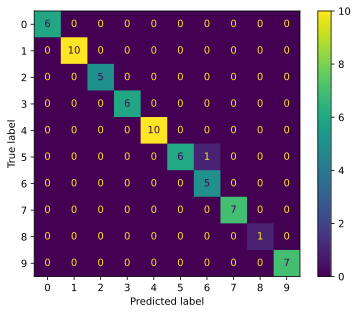

2º minibatch:


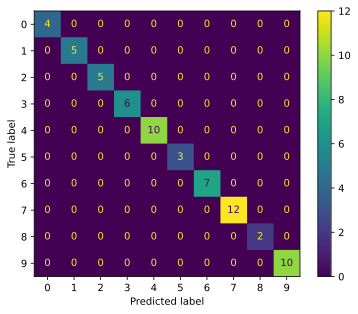

3º minibatch:


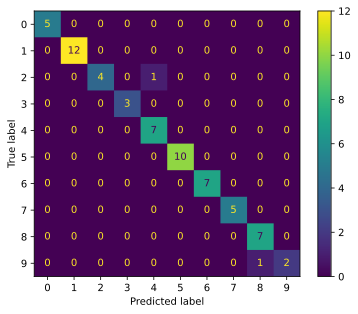

4º minibatch:


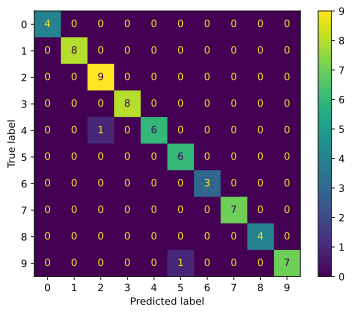

5º minibatch:


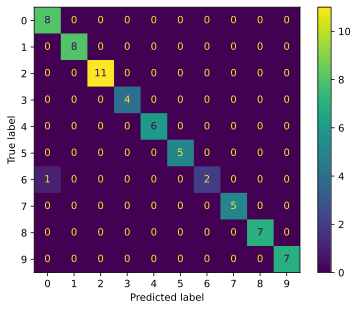

6º minibatch:


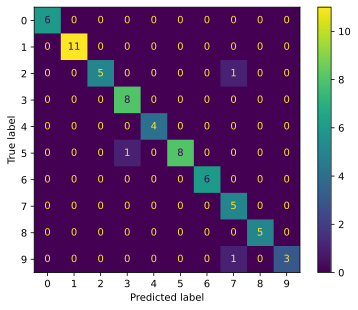

7º minibatch:


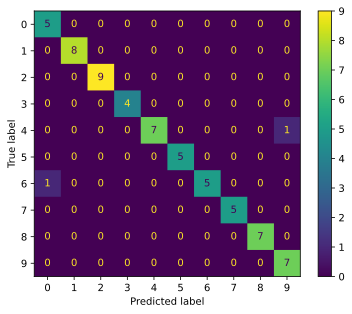

8º minibatch:


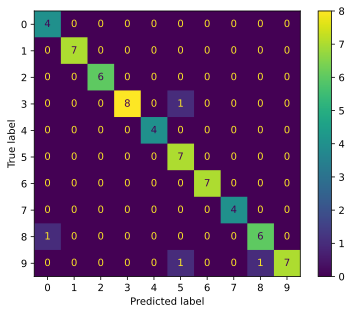

9º minibatch:


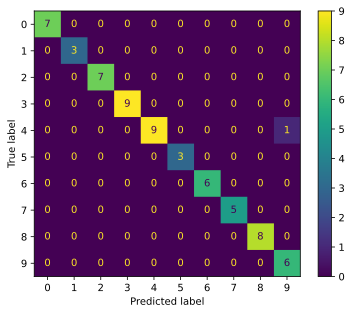

10º minibatch:


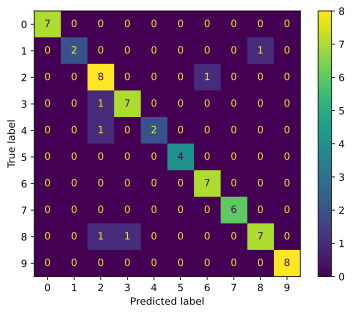

11º minibatch:


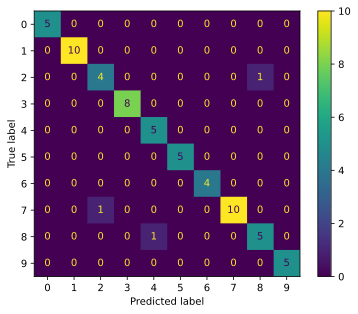

12º minibatch:


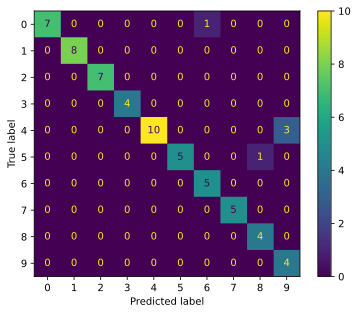

13º minibatch:


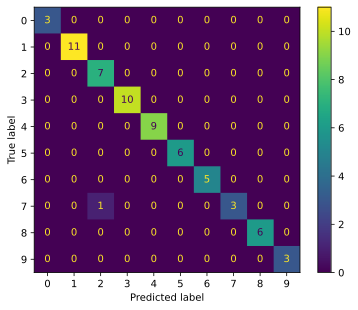

14º minibatch:


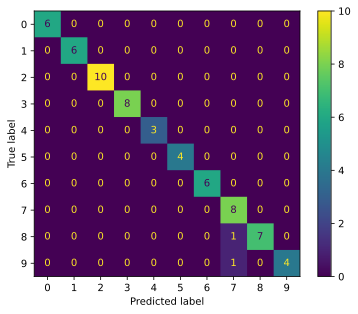

15º minibatch:


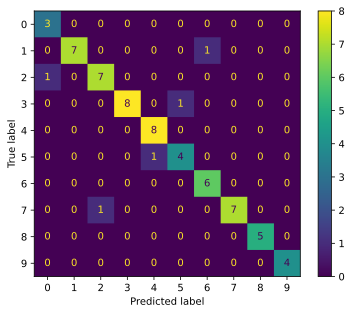

16º minibatch:


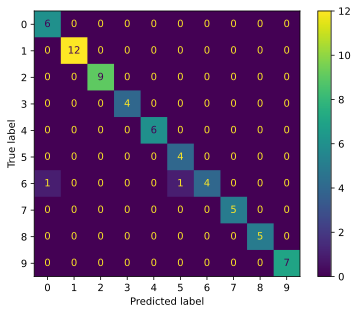

17º minibatch:


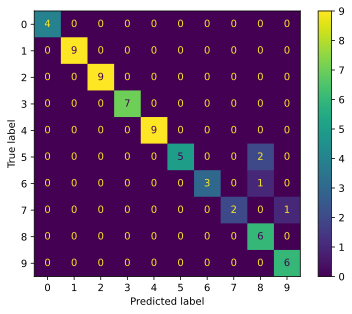

18º minibatch:


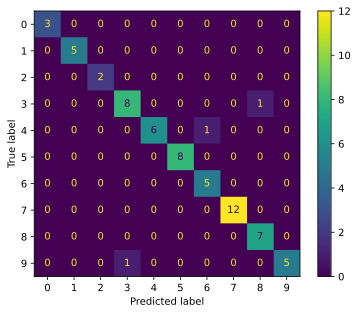

19º minibatch:


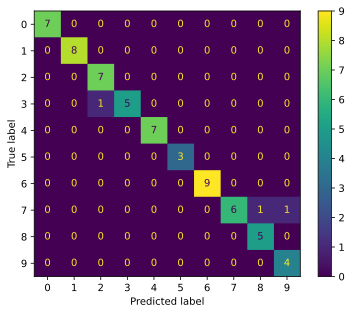

20º minibatch:


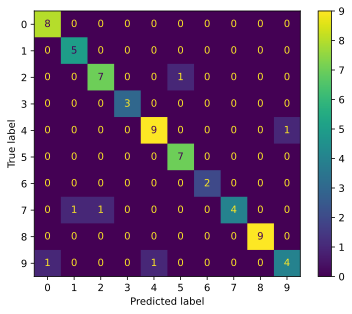

21º minibatch:


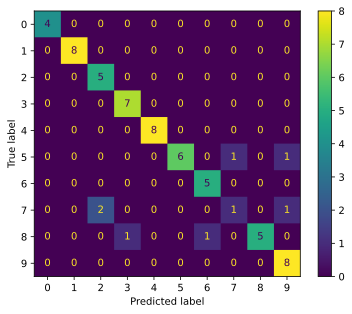

22º minibatch:


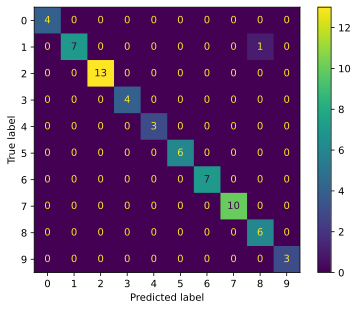

23º minibatch:


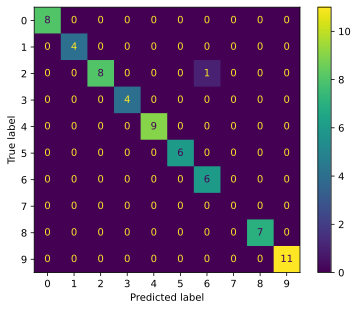

24º minibatch:


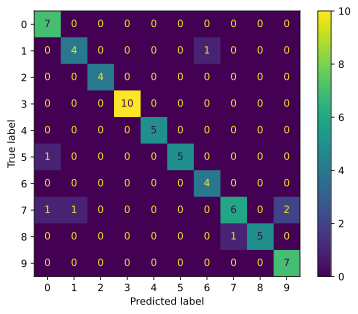

25º minibatch:


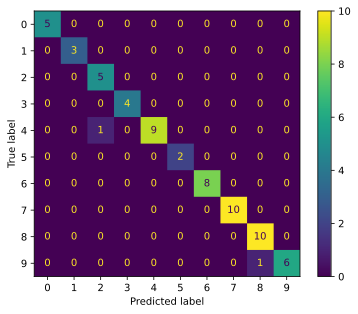

26º minibatch:


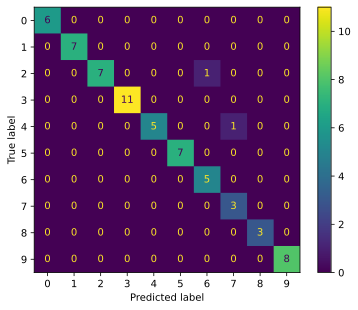

27º minibatch:


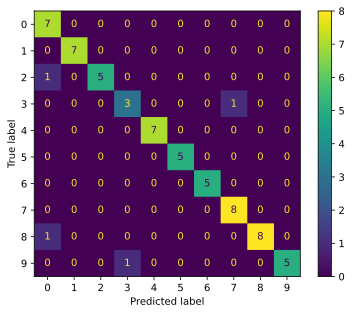

28º minibatch:


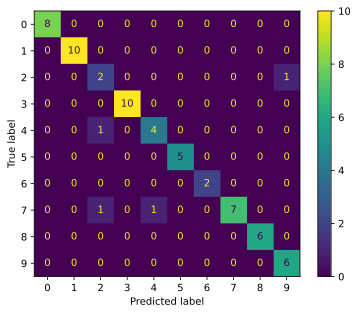

29º minibatch:


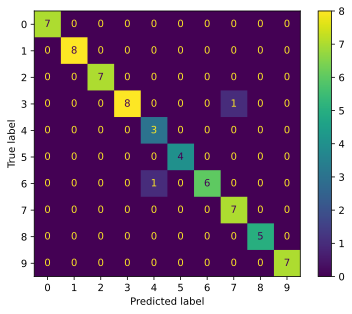

30º minibatch:


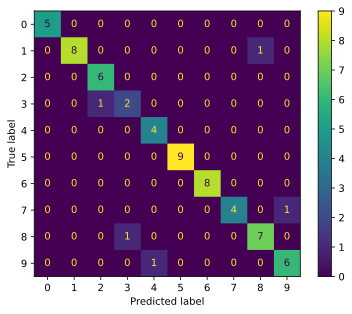

31º minibatch:


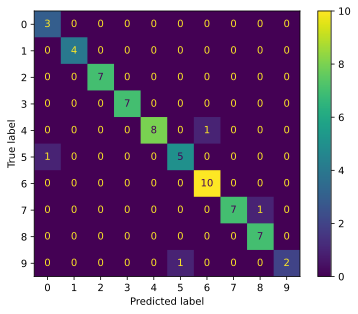

32º minibatch:


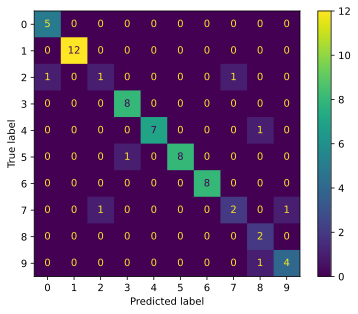

33º minibatch:


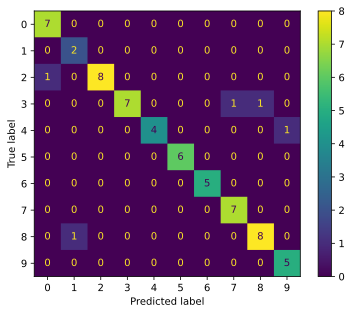

34º minibatch:


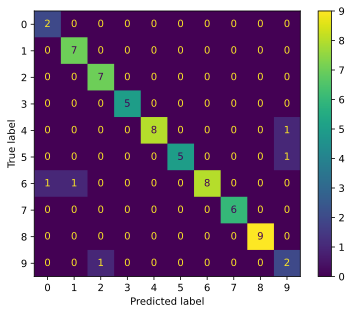

35º minibatch:


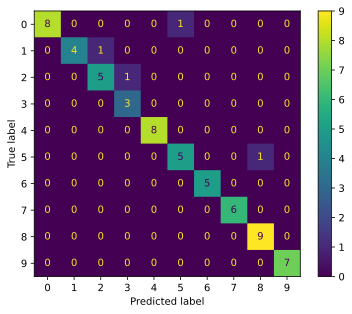

36º minibatch:


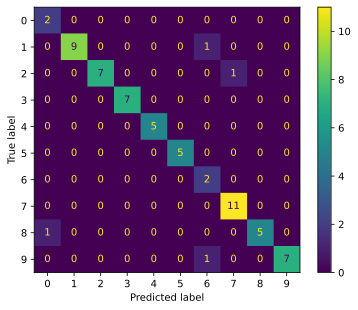

37º minibatch:


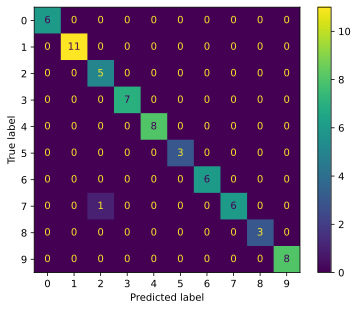

38º minibatch:


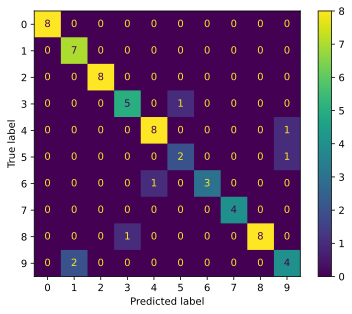

39º minibatch:


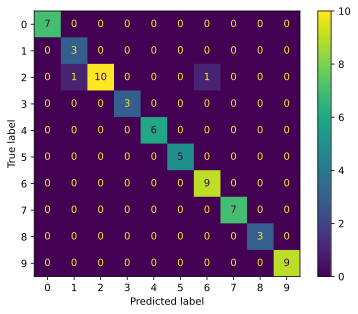

40º minibatch:


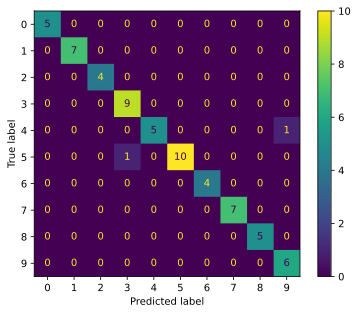

41º minibatch:


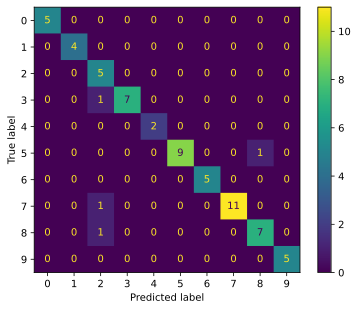

42º minibatch:


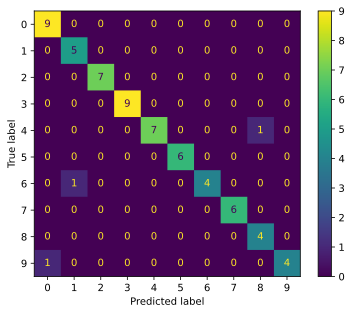

43º minibatch:


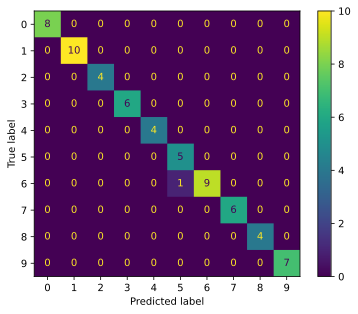

44º minibatch:


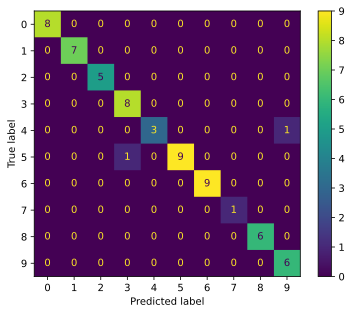

45º minibatch:


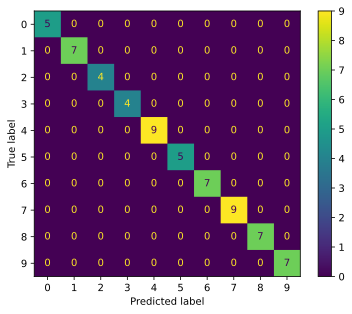

46º minibatch:


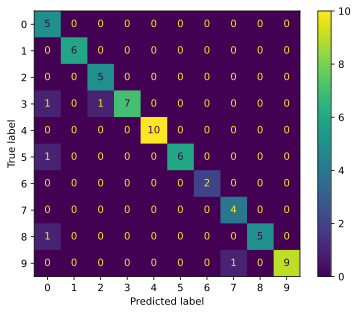

47º minibatch:


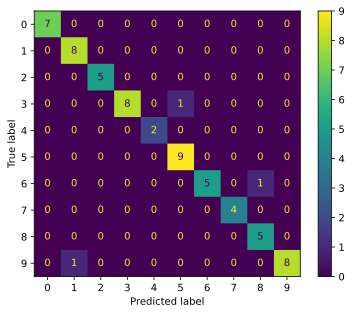

48º minibatch:


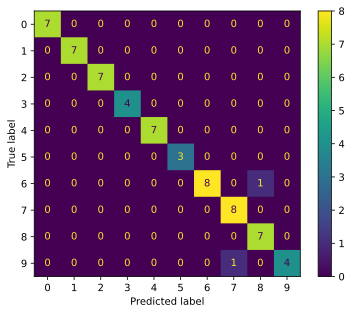

49º minibatch:


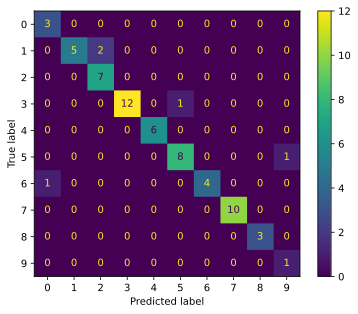

50º minibatch:


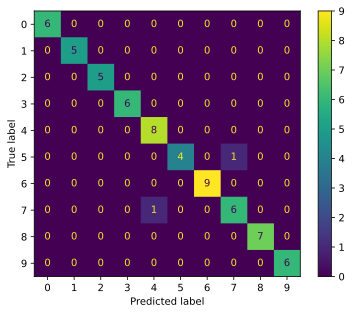

51º minibatch:


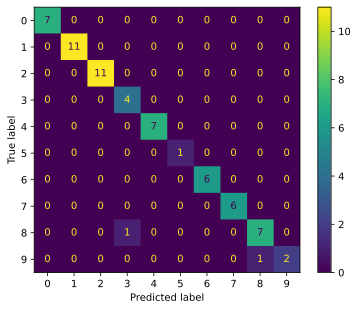

52º minibatch:


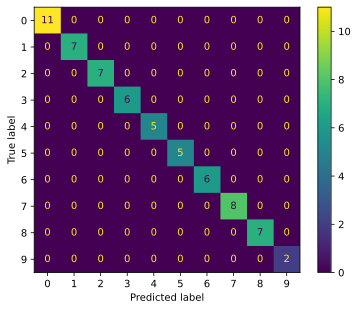

53º minibatch:


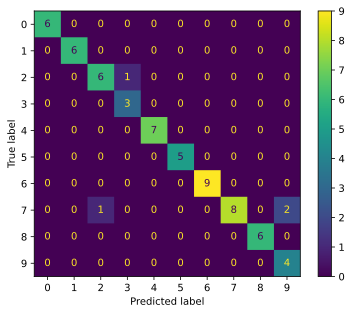

54º minibatch:


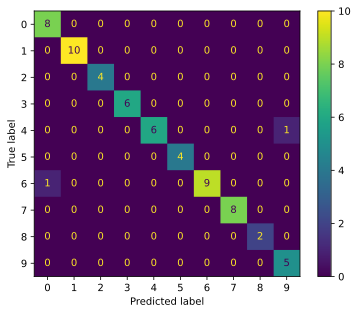

55º minibatch:


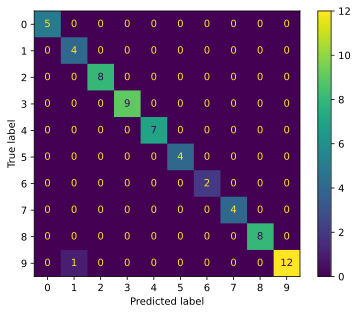

56º minibatch:


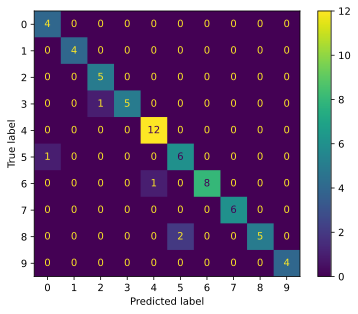

57º minibatch:


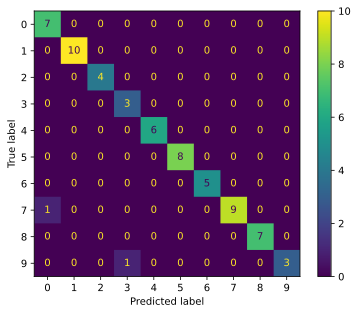

58º minibatch:


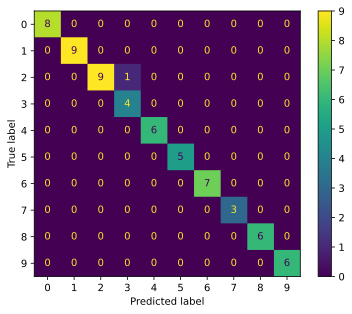

59º minibatch:


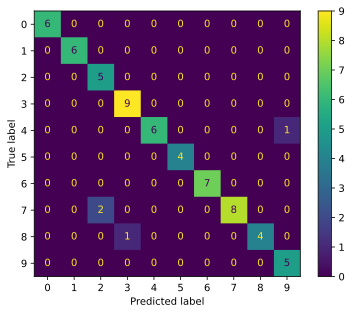

60º minibatch:


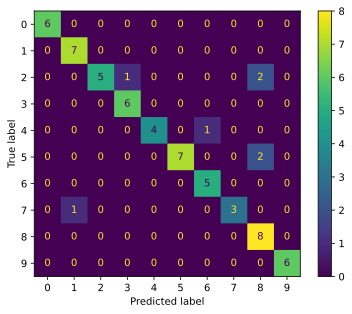

61º minibatch:


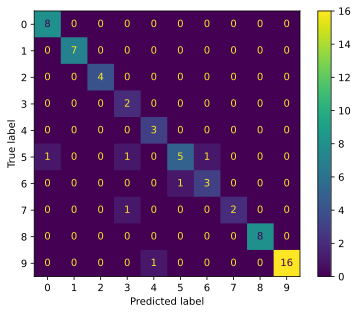

62º minibatch:


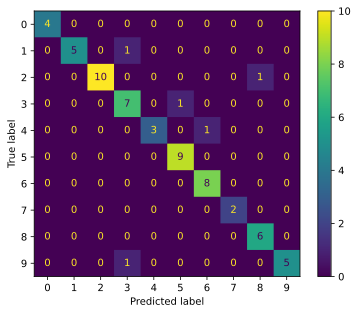

63º minibatch:


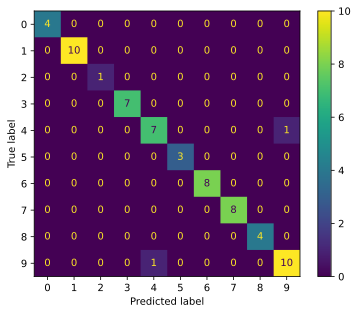

64º minibatch:


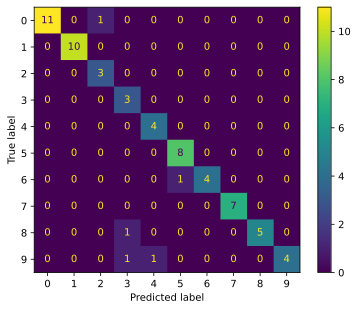

65º minibatch:


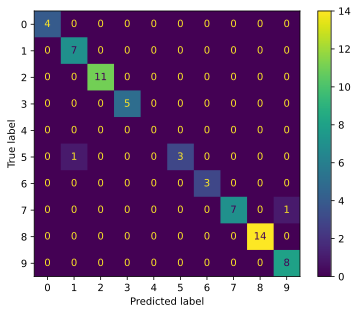

66º minibatch:


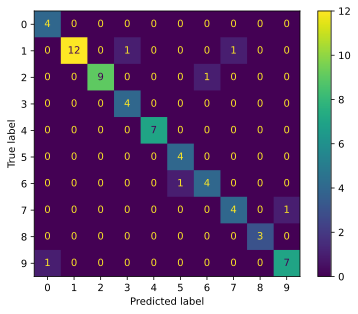

67º minibatch:


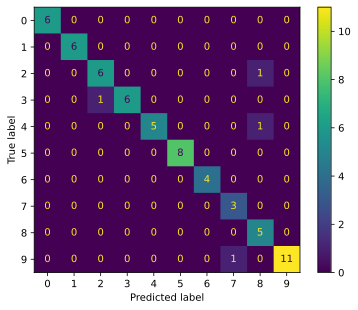

68º minibatch:


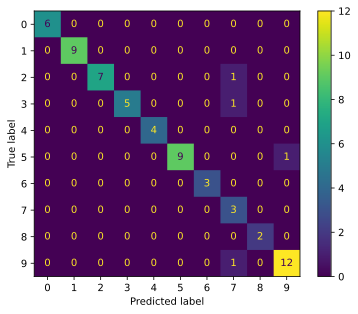

69º minibatch:


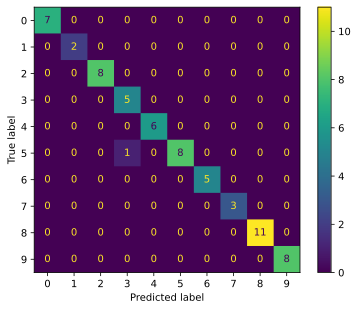

70º minibatch:


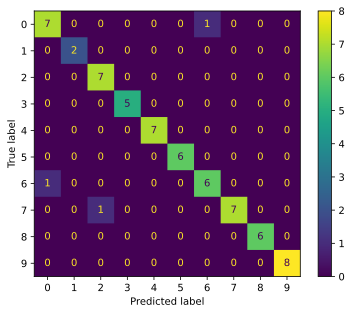

71º minibatch:


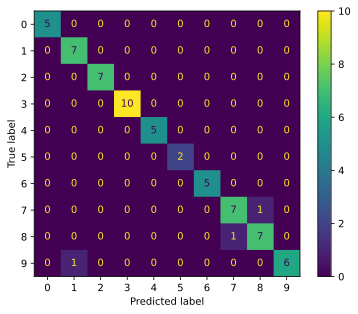

72º minibatch:


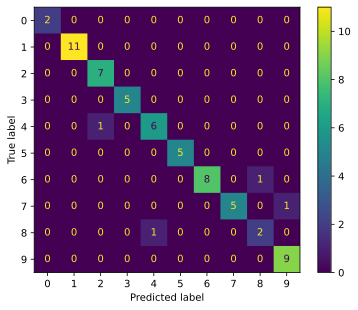

73º minibatch:


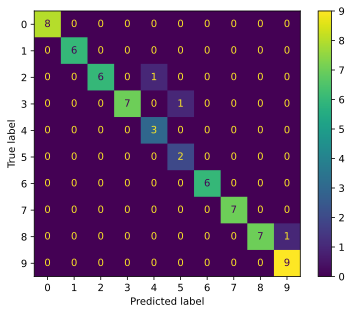

74º minibatch:


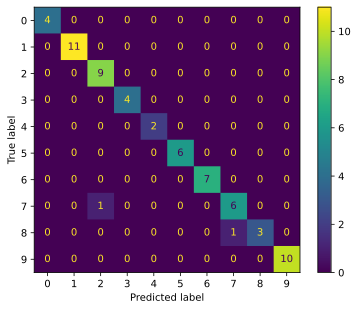

75º minibatch:


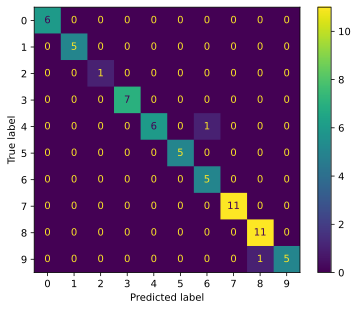

76º minibatch:


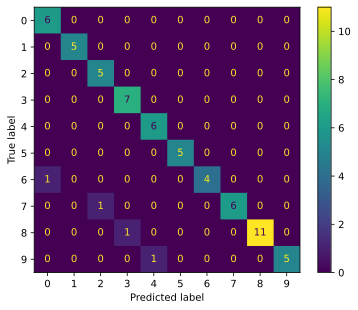

77º minibatch:


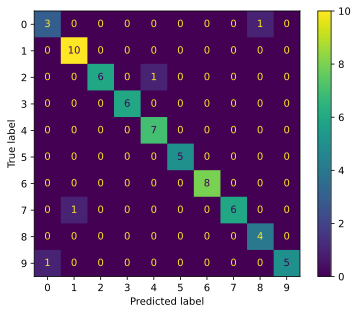

78º minibatch:


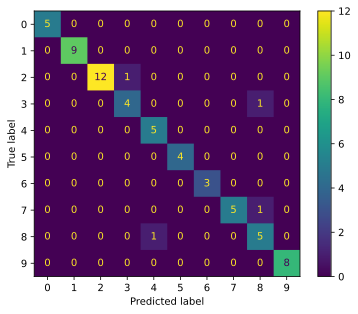

79º minibatch:


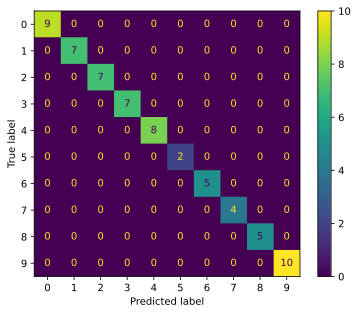

80º minibatch:


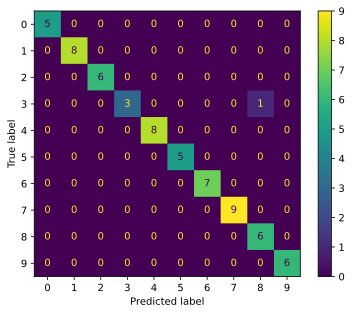

81º minibatch:


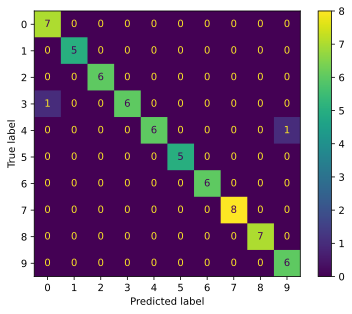

82º minibatch:


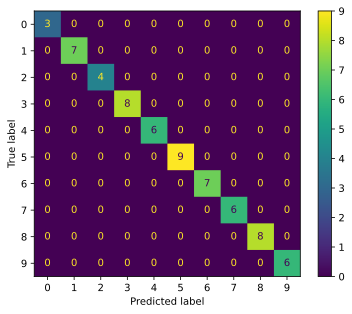

83º minibatch:


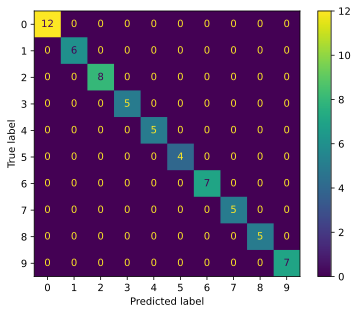

84º minibatch:


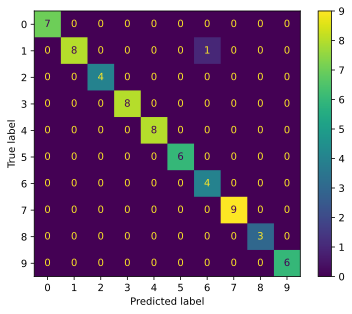

85º minibatch:


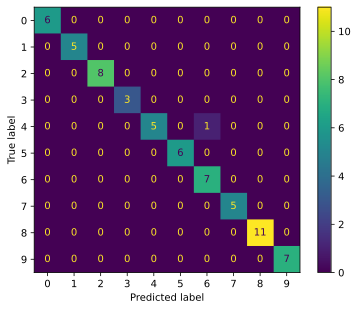

86º minibatch:


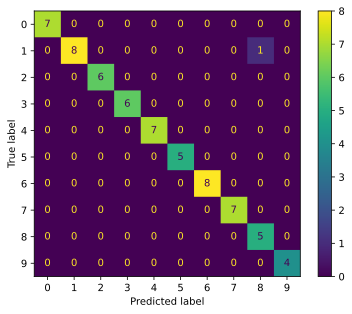

87º minibatch:


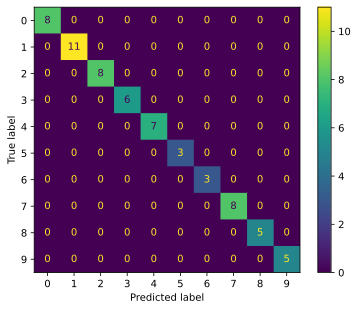

88º minibatch:


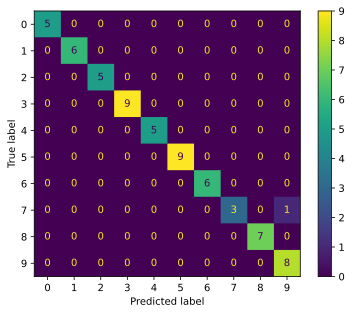

89º minibatch:


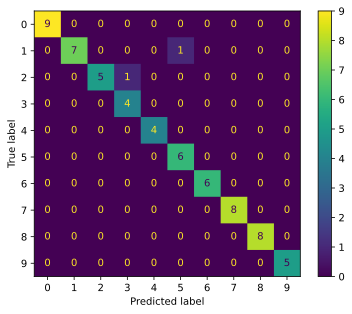

90º minibatch:


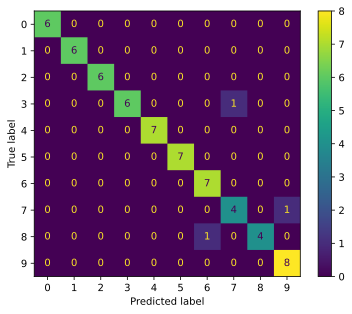

91º minibatch:


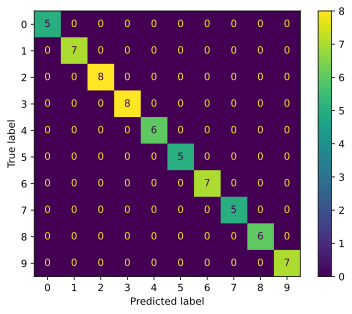

92º minibatch:


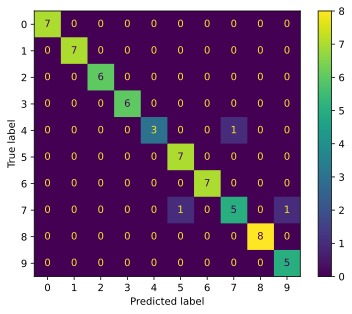

93º minibatch:


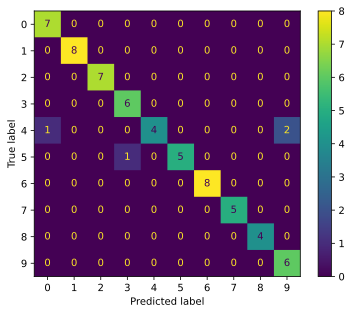

94º minibatch:


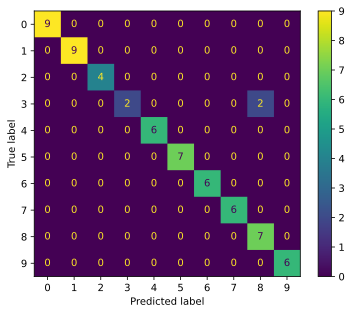

95º minibatch:


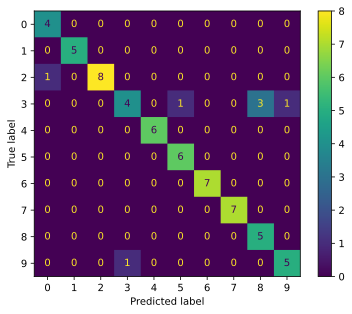

96º minibatch:


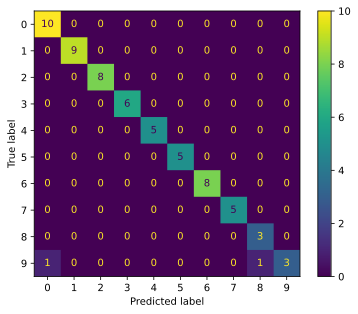

97º minibatch:


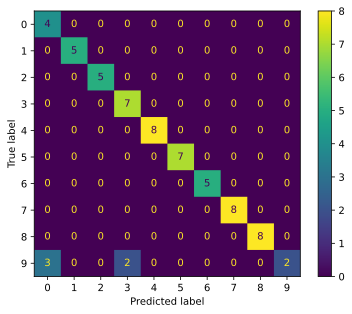

98º minibatch:


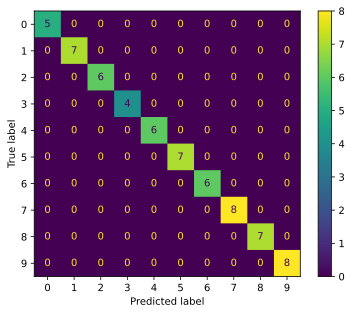

99º minibatch:


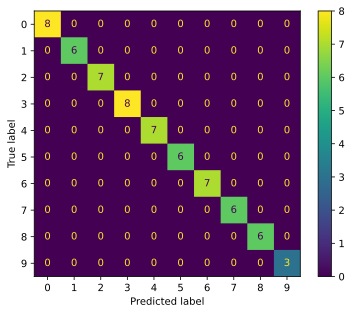

100º minibatch:


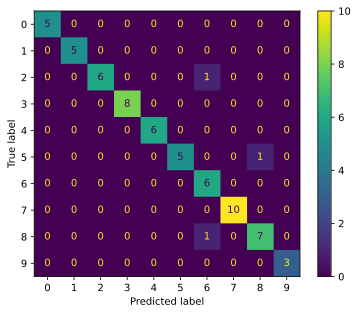

101º minibatch:


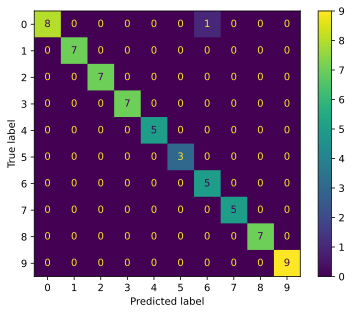

102º minibatch:


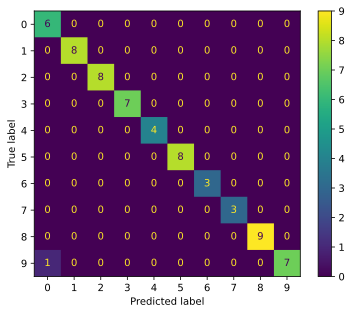

103º minibatch:


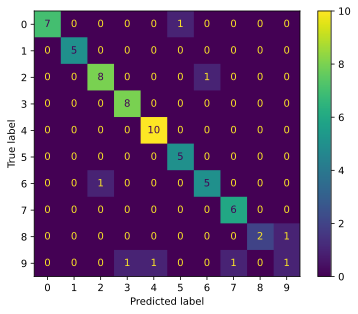

104º minibatch:


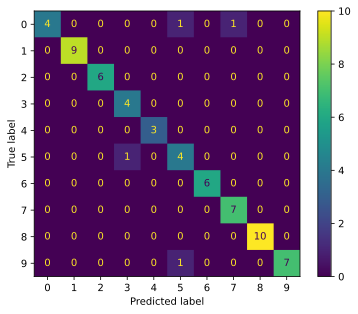

105º minibatch:


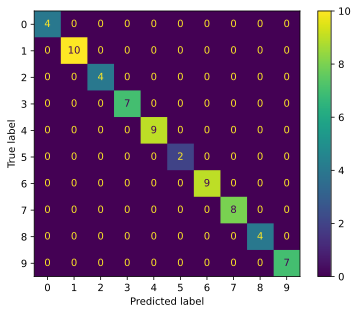

106º minibatch:


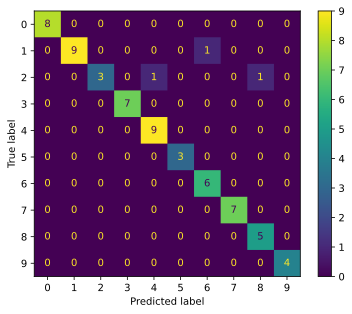

107º minibatch:


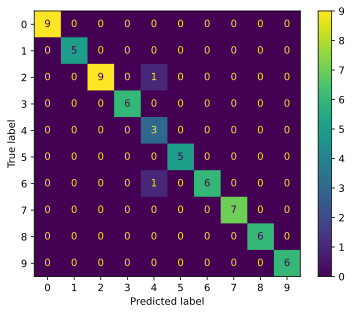

108º minibatch:


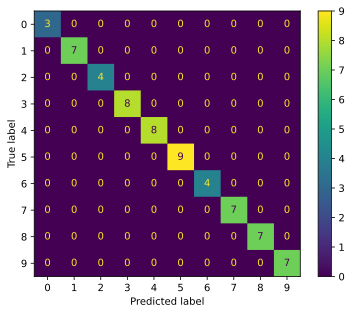

109º minibatch:


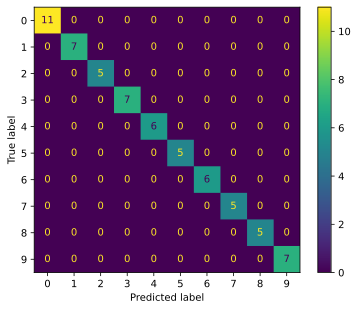

110º minibatch:


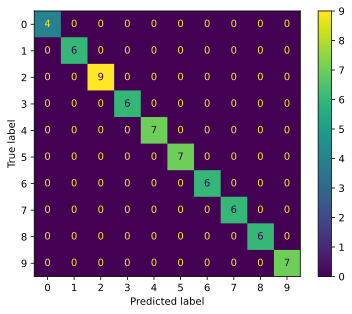

111º minibatch:


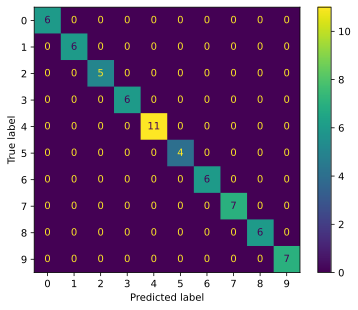

112º minibatch:


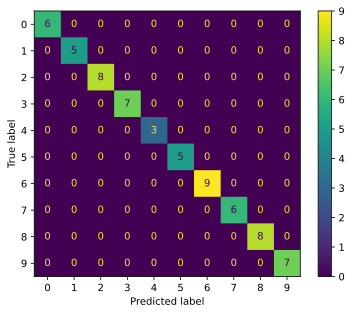

113º minibatch:


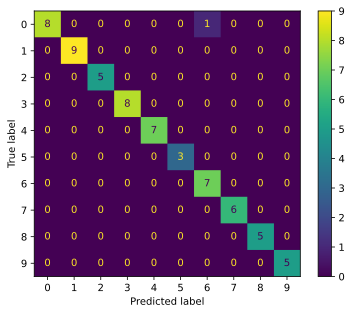

114º minibatch:


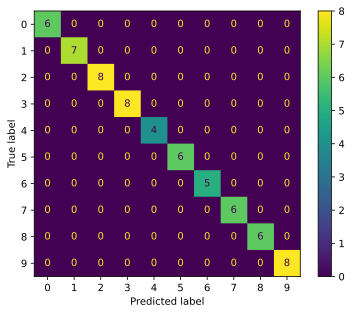

115º minibatch:


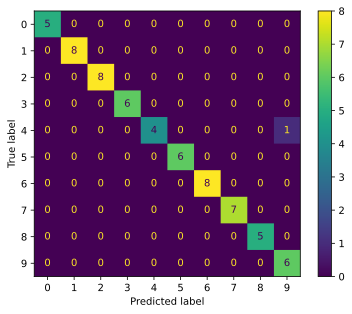

116º minibatch:


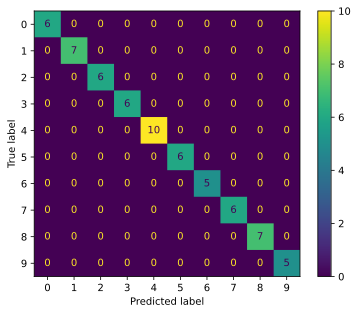

117º minibatch:


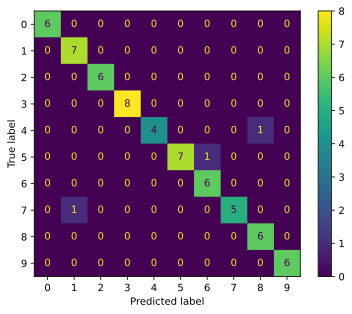

118º minibatch:


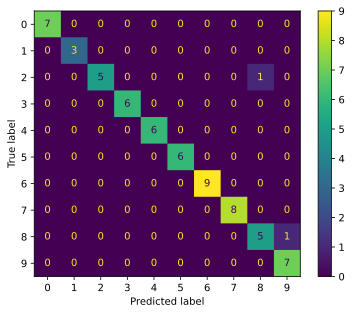

119º minibatch:


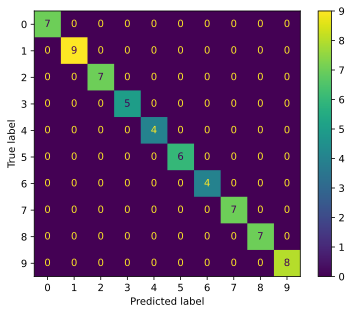

120º minibatch:


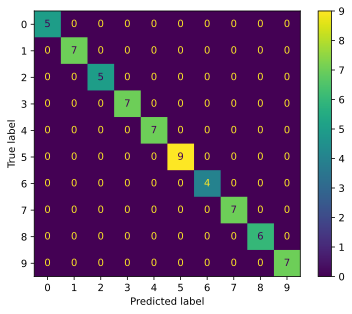

121º minibatch:


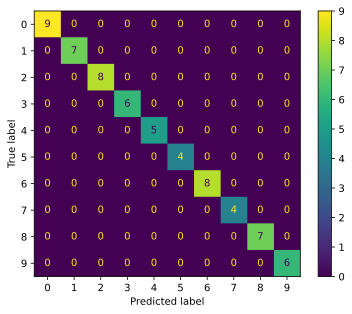

122º minibatch:


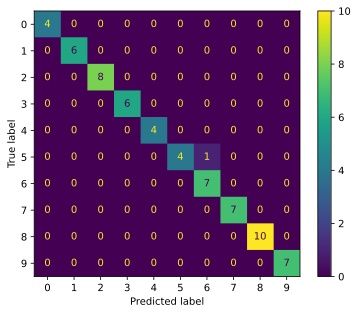

123º minibatch:


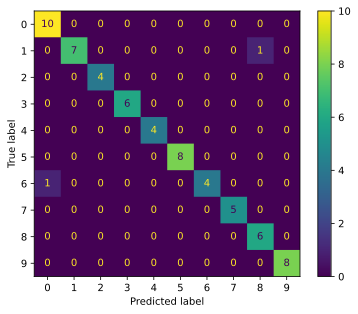

124º minibatch:


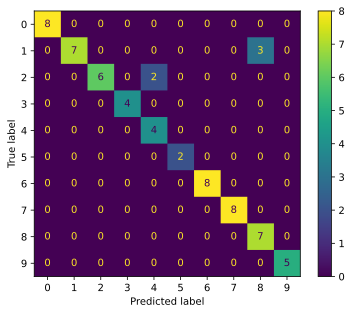

125º minibatch:


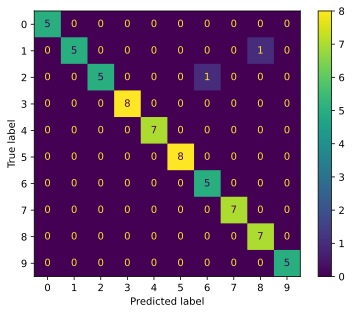

126º minibatch:


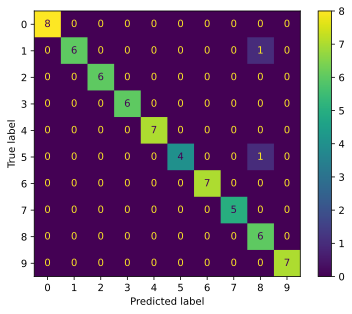

127º minibatch:


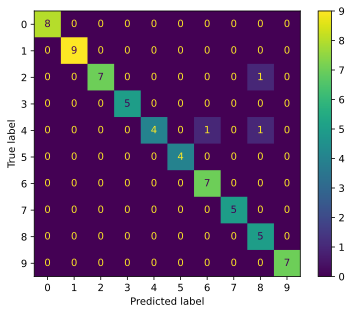

128º minibatch:


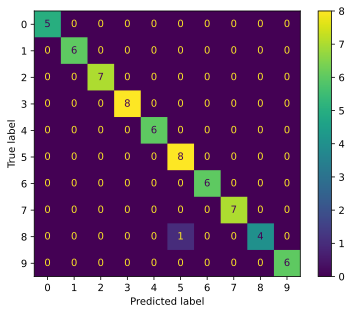

129º minibatch:


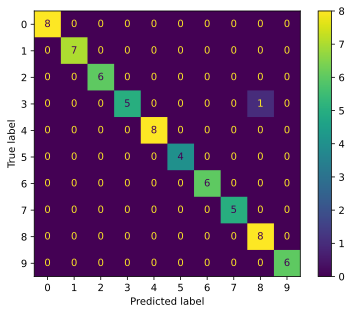

130º minibatch:


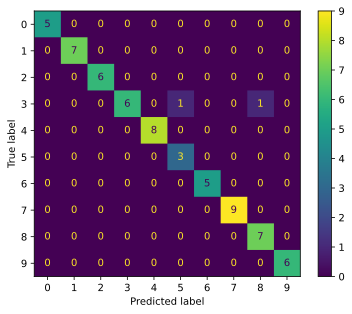

131º minibatch:


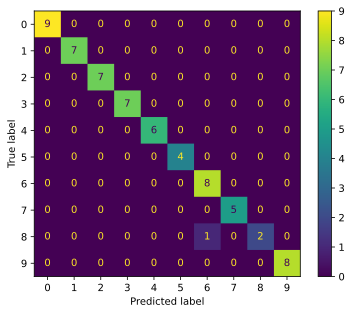

132º minibatch:


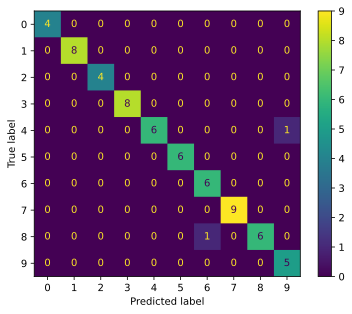

133º minibatch:


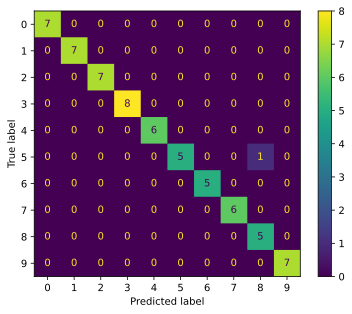

134º minibatch:


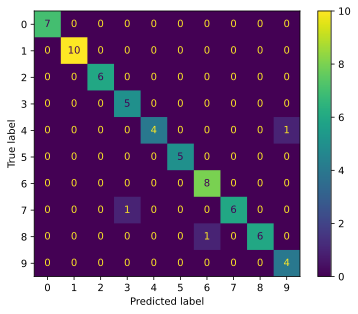

135º minibatch:


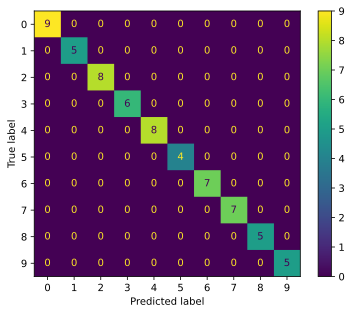

136º minibatch:


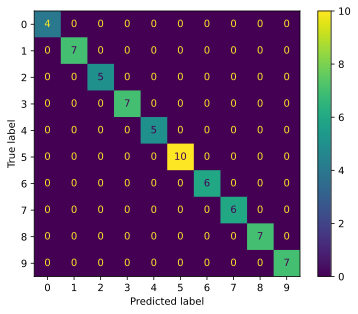

137º minibatch:


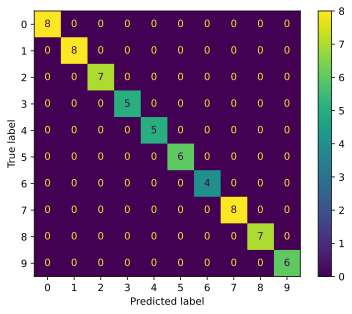

138º minibatch:


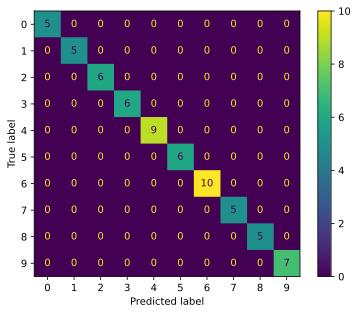

139º minibatch:


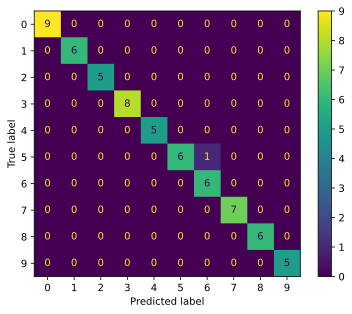

140º minibatch:


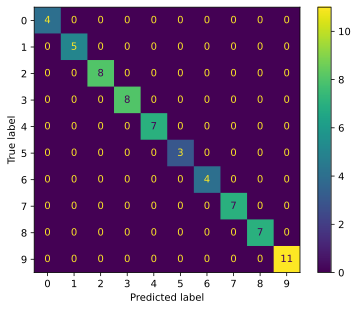

141º minibatch:


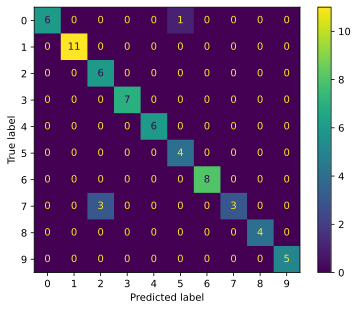

142º minibatch:


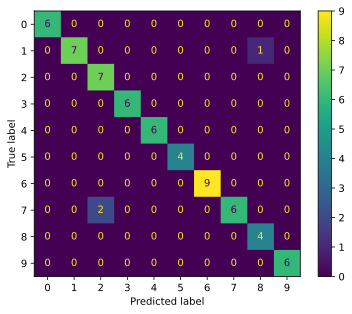

143º minibatch:


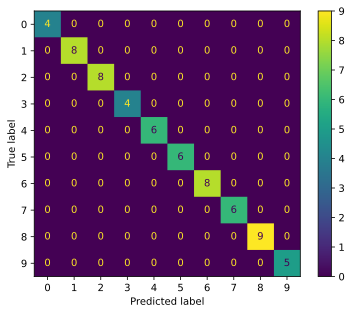

144º minibatch:


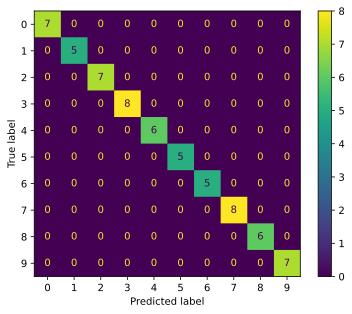

145º minibatch:


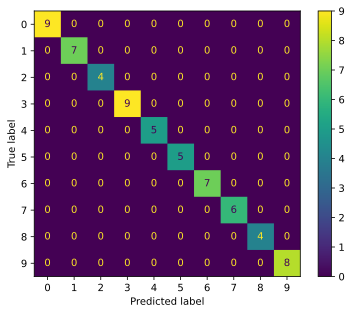

146º minibatch:


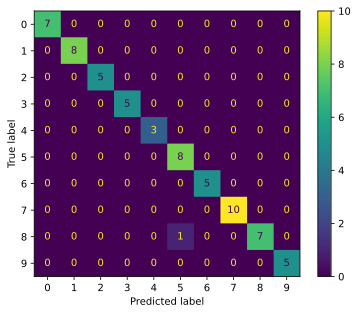

147º minibatch:


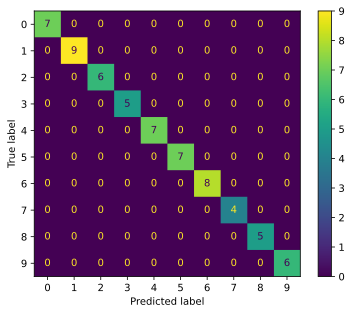

148º minibatch:


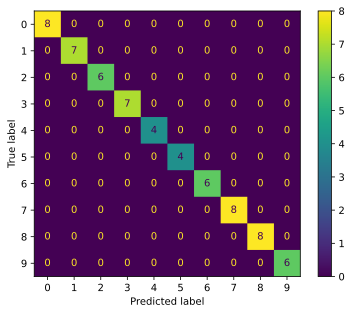

149º minibatch:


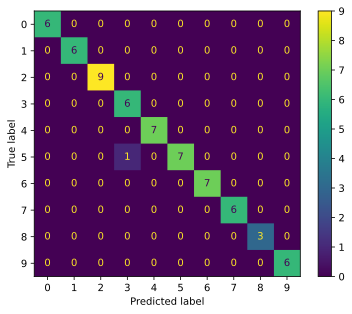

150º minibatch:


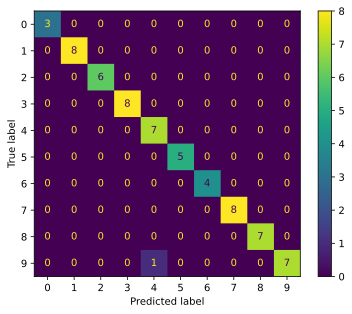

151º minibatch:


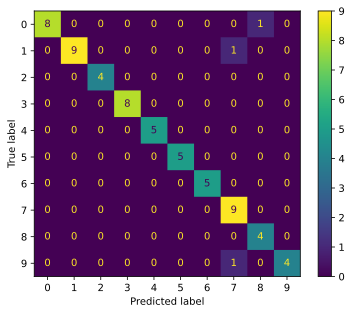

152º minibatch:


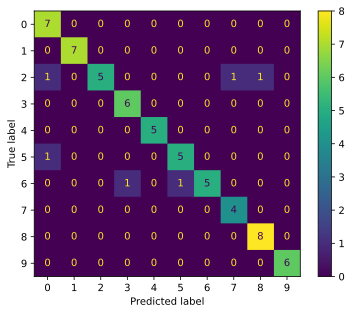

153º minibatch:


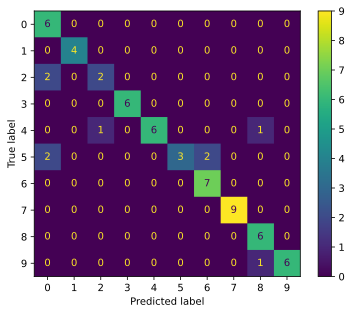

154º minibatch:


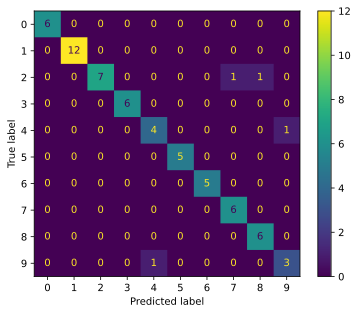

155º minibatch:


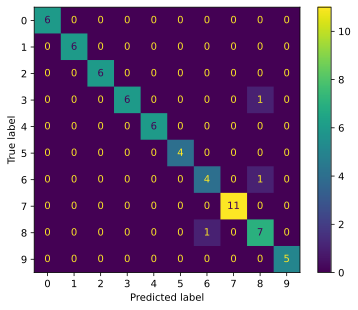

156º minibatch:


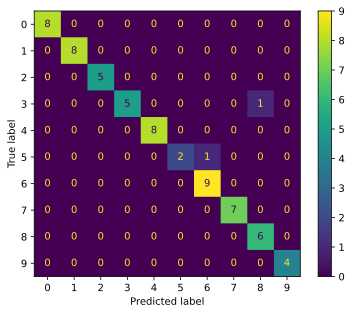

157º minibatch:


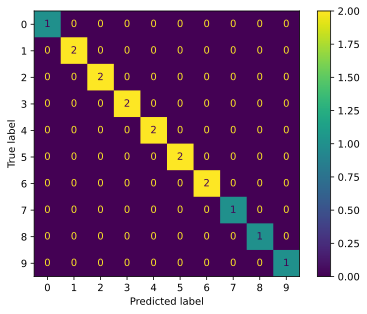

In [224]:
global_conf_matrix = tf.zeros((10, 10), dtype=tf.int32)
i=0
for X, y in data.val_dataloader():
    i+=1
    preds=tf.argmax(model_2e_2(X),axis=1)
    conf_matrix = confusion_matrix(y, preds, labels=tf.range(10))
    sklearn.metrics.ConfusionMatrixDisplay(conf_matrix).plot()
    print(f'{i}º minibatch:')
    plt.show()
    global_conf_matrix += conf_matrix

In [225]:
most_confused_pairs = []
for i in range(10):
    for j in range(10):
        if i != j:
            if global_conf_matrix[i, j] > 0:
                most_confused_pairs.append((i, j, global_conf_matrix[i, j]))

most_confused_pairs.sort(key=lambda x: x[2], reverse=True)

for i, j, count in most_confused_pairs:
    print(f"A classe {i} foi confundida com a classe {j} por {count} {'vezes' if count > 1 else 'vez'}.")

A classe 4 foi confundida com a classe 9 por 21 vezes.
A classe 7 foi confundida com a classe 2 por 21 vezes.
A classe 7 foi confundida com a classe 9 por 15 vezes.
A classe 3 foi confundida com a classe 8 por 13 vezes.
A classe 1 foi confundida com a classe 8 por 11 vezes.
A classe 2 foi confundida com a classe 8 por 10 vezes.
A classe 5 foi confundida com a classe 8 por 10 vezes.
A classe 3 foi confundida com a classe 5 por 9 vezes.
A classe 5 foi confundida com a classe 3 por 9 vezes.
A classe 6 foi confundida com a classe 0 por 9 vezes.
A classe 9 foi confundida com a classe 0 por 9 vezes.
A classe 9 foi confundida com a classe 3 por 9 vezes.
A classe 9 foi confundida com a classe 4 por 9 vezes.
A classe 2 foi confundida com a classe 0 por 8 vezes.
A classe 2 foi confundida com a classe 6 por 8 vezes.
A classe 5 foi confundida com a classe 0 por 8 vezes.
A classe 5 foi confundida com a classe 6 por 8 vezes.
A classe 8 foi confundida com a classe 3 por 8 vezes.
A classe 9 foi confun